## Data and Package Importing

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
from scipy import stats
from QC import *
sc.settings.set_figure_params(dpi=100)

### Load data and preprocess

In [2]:
adata = sc.read_h5ad("4058_colon.h5ad")

In [3]:
reorder_AnnData(adata) #quick reordering of AnnData object, since our inflection point analysis assumes that libraries are sorted from highest to lowest quality
adata #this also calculates the n_counts value, which is the total number of counts per cell/barcode

AnnData object with n_obs × n_vars = 29134 × 21611
    obs: 'CellRanger_2', 'CellRanger_3', 'CellRanger_2_R', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'manual_label', 'n_counts'
    var: 'dropkick_coef'
    uns: 'dropkick_args', 'dropkick_thresholds'

In [4]:
adata.raw = adata #checkpoint before normalizing and scaling data

In [5]:
adata.X = adata.X.todense()

In [6]:
#create new "observation" as percent mito and mean mito
mito_genes = adata.var_names.str.startswith('mt-') 
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1) / adata.obs['n_counts']
adata.obs['mean_mito'] = np.mean(adata[:, mito_genes].X, axis=1)

/Users/cody/.virtualenvs/sc/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [7]:
#create new "observation" as percent hematopoietic and mean hematopoietic
hematopoietic_genes = adata.var_names.str.contains('Hbb-bs$|Cd14$|Jchain$|NAGK$')
adata.obs['percent_hematopoietic'] = np.sum(adata[:, hematopoietic_genes].X, axis=1) / adata.obs['n_counts']
adata.obs['mean_hematopoietic'] = np.mean(adata[:, hematopoietic_genes].X, axis=1)

#It's important to examine multiple methods of compiling genes into a single meta-feature, as percents may be biased towards the number of genes used in the summation while means may be thrown off by outliers.

### Find inflection point

Inflection point at AAAACTCGACTCAGAAT       3634
TGACTACCGTTTGACCAGT     6580
GGAGAAGCAAGGTAAT       10344
AGGGAACGAAAATCGTT      29133
Name: n_counts, dtype: int64 for [0, 15, 30, 100] percentiles of greatest secant distances


{0: 3634, 15: 6580, 30: 10344, 100: 29133}

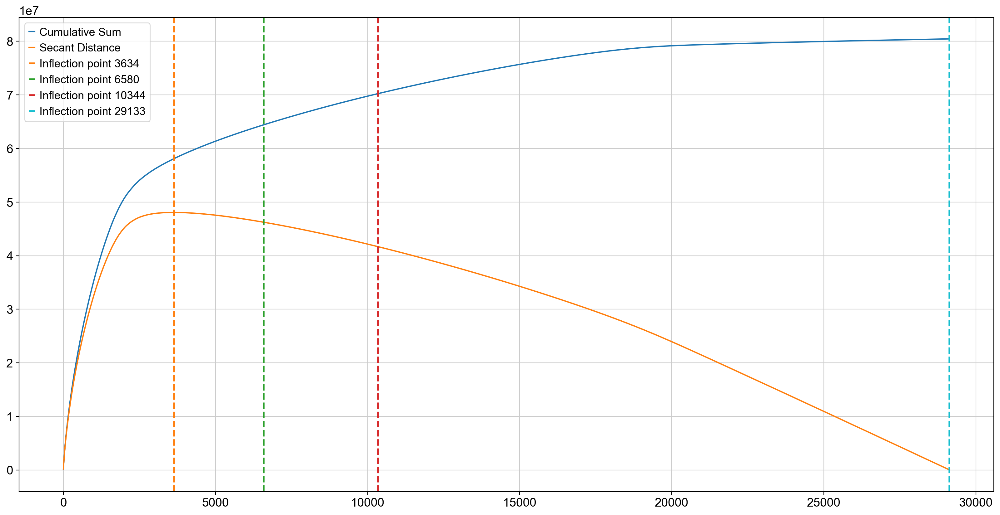

In [8]:
find_inflection(adata)

In [9]:
#filter cells out based on minimum quality
sc.pp.filter_cells(adata,min_counts=adata.obs.iloc[3634].n_counts)

/Users/cody/.virtualenvs/sc/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [10]:
adata

AnnData object with n_obs × n_vars = 3635 × 21611
    obs: 'CellRanger_2', 'CellRanger_3', 'CellRanger_2_R', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'manual_label', 'n_counts', 'percent_mito', 'mean_mito', 'percent_hematopoietic', 'mean_hematopoietic'
    var: 'dropkick_coef'
    uns: 'dropkick_args', 'dropkick_thresholds'

In [11]:
adata.obs['ranked_n_counts'] = np.argsort(adata.obs['n_counts']) 

### Normalize and perform linear dimensionality reduction with PCA

In [12]:
sc.pp.normalize_total(adata) #each gene count value is divided by the total number of counts for that respective cell  
sc.pp.log1p(adata) #log1p normalization

In [13]:
#same as above but wrapped up in one function and utilizes the arcsinh transform instead of log1p, commented out for convenience
#arcsinh_transform(adata)

In [14]:
adata

AnnData object with n_obs × n_vars = 3635 × 21611
    obs: 'CellRanger_2', 'CellRanger_3', 'CellRanger_2_R', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'manual_label', 'n_counts', 'percent_mito', 'mean_mito', 'percent_hematopoietic', 'mean_hematopoietic', 'ranked_n_counts'
    var: 'dropkick_coef'
    uns: 'dropkick_args', 'dropkick_thresholds', 'log1p'

In [15]:
sc.pp.scale(adata) #scaling by variance and centering to zero for visualization
sc.tl.pca(adata) #performing PCA

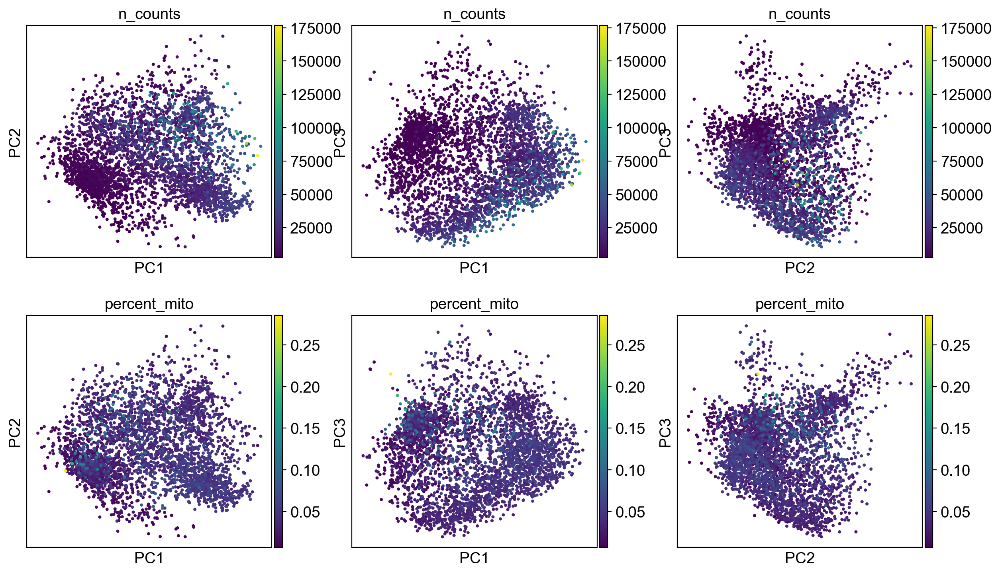

In [16]:
sc.pl.pca(adata, color=['n_counts','percent_mito'],components=['1,2','1,3','2,3'],ncols=3)

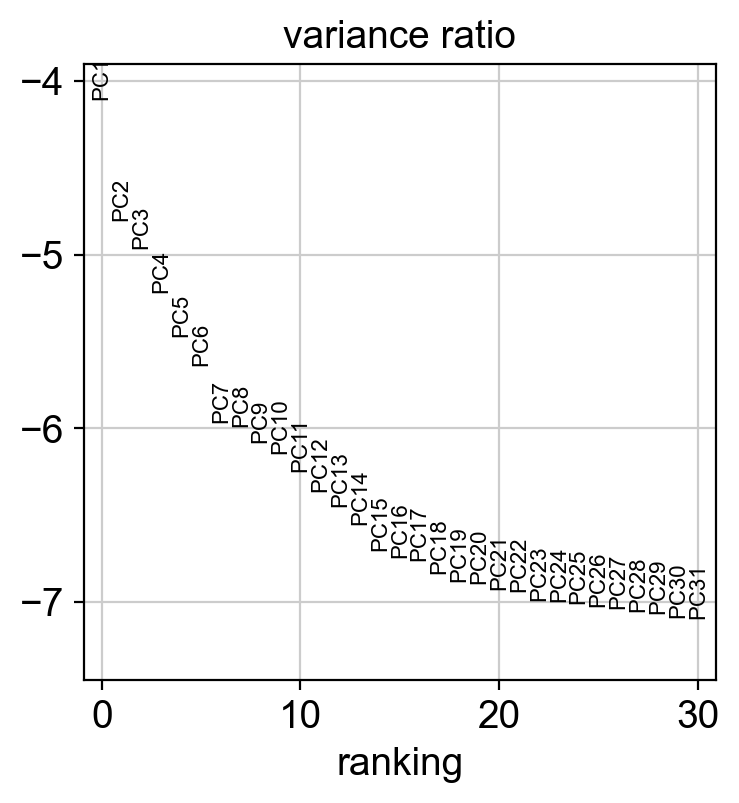

In [17]:
sc.pl.pca_variance_ratio(adata, log=True) #examine amount of variance captured by each principal component

### Non-linear dimensionality reduction with UMAP

In [18]:
sc.pp.neighbors(adata, n_neighbors=int(np.sqrt(adata.n_obs)), n_pcs=30) #UMAP requires this neighborhood calculation first, will give deprecation warnings

In [19]:
sc.tl.umap(adata) #perform UMAP

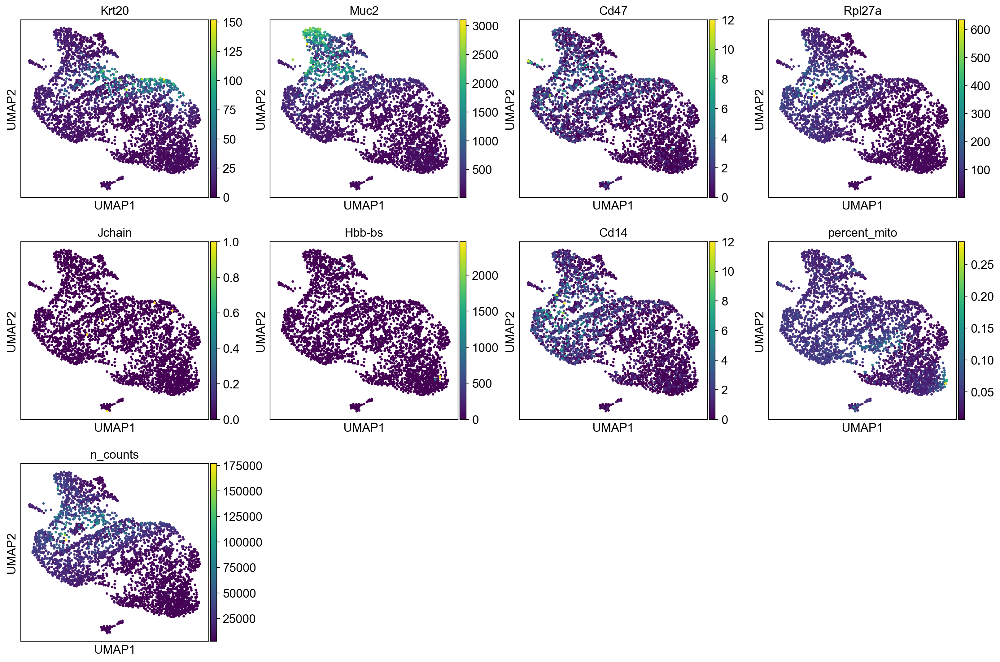

In [20]:
sc.pl.umap(adata,color=['Krt20','Muc2','Cd47','Rpl27a','Jchain','Hbb-bs','Cd14','percent_mito','n_counts']) #plot marker genes to determine which clusters to keep or gate out

### Clustering

In [21]:
sc.tl.louvain(adata,resolution=1.6) 
#the resolution value here determines the granularity of clustering
#higher resolution = smaller, refined clusters
#lower resolution = larger, coarse grained clusters

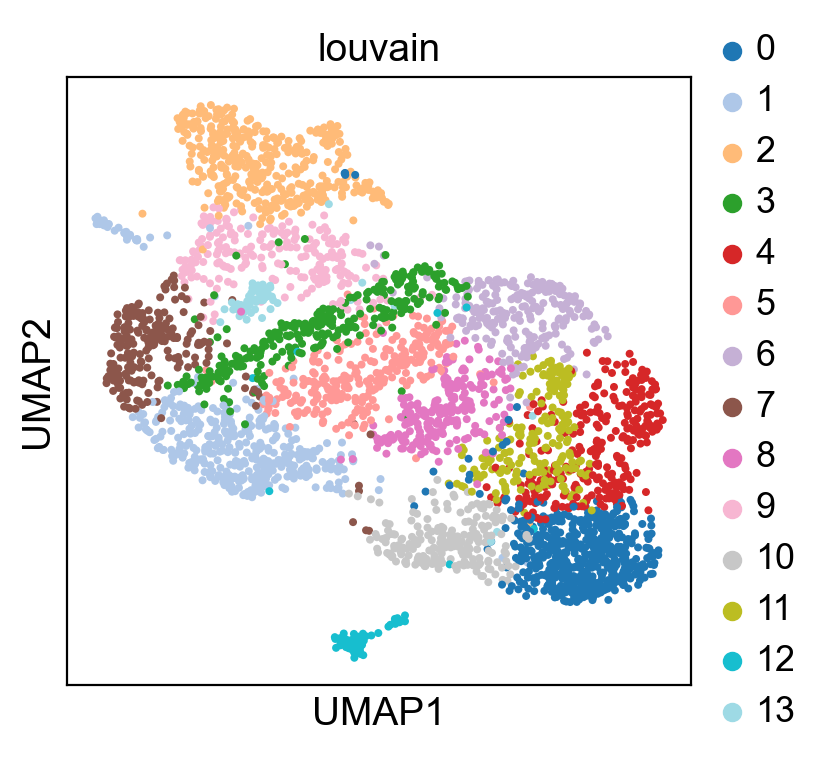

In [22]:
sc.pl.umap(adata, color=['louvain'],wspace=0.5,palette='tab20')

### Cluster quantification and non-parametric testing of gene expression profiles for gating

In [23]:
cluster_summary_stats(adata,raw=True) #in this case it's after normalization, but if you want to find these statistics for the raw counts, set the raw parameter to True

/Users/cody/.virtualenvs/sc/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [24]:
cluster_wilcoxon_rank_sum(adata,['Krt20','Muc2','Jchain','percent_mito','mean_mito','percent_hematopoietic','mean_hematopoietic'],alternative='greater') 
#this takes a list of features that exist in the normalized representation of the data and performs a wilcoxon rank sum test between each cluster against the global counterparts of those data.
#these features can be single genes or compiled 'metagenes' such as the percent_mito and the mean_mito, as long as their values can be accessed in the AnnData object by using the .obs_vector method
#the "alternative" parameter is passed to scipy's "mann-whitney u" to desgnate the sidedness of the test, in this case the default is a one-sided hypothesis for values greater than the null.

In [25]:
cluster_p_threshold(adata,0.05)
#this takes the p-values calculated above (per cluster) and simply returns a binarized output (0 or 1) that can be visualized
#the output represents wether or not the cluster has a p-value below the set threshold (0.05 in this case) 

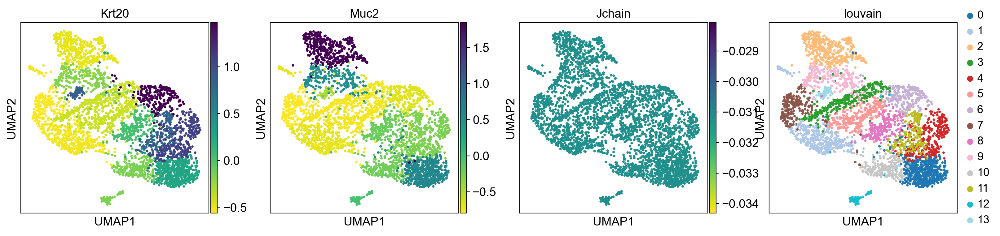

In [26]:
sc.pl.umap(adata,color=['Krt20','Muc2','Jchain','louvain'],color_map='viridis_r',layer='Cluster_Medians') #Cluster medians per feature

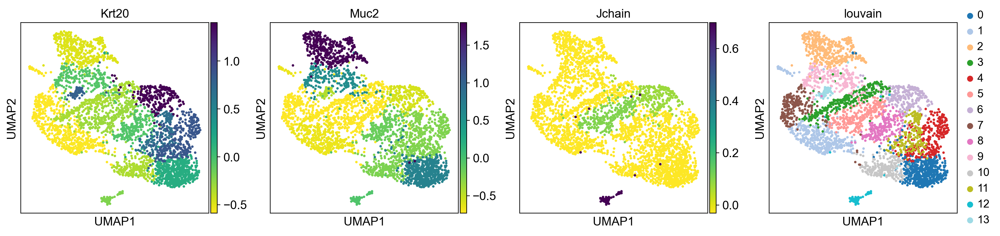

In [27]:
sc.pl.umap(adata,color=['Krt20','Muc2','Jchain','louvain'],color_map='viridis_r',layer='Cluster_Means') #Cluster means per feature≤

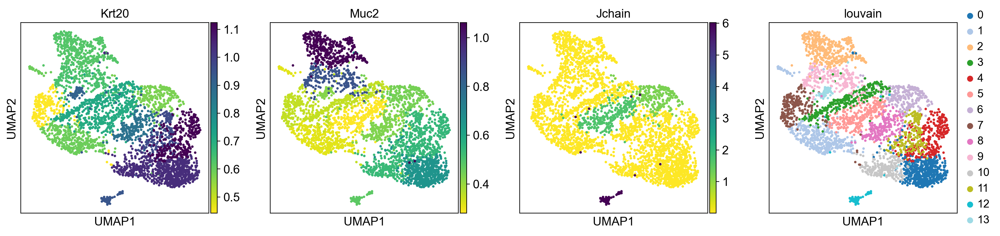

In [28]:
sc.pl.umap(adata,color=['Krt20','Muc2','Jchain','louvain'],color_map='viridis_r',layer='Cluster_Stdevs') #Cluster stdevs per feature

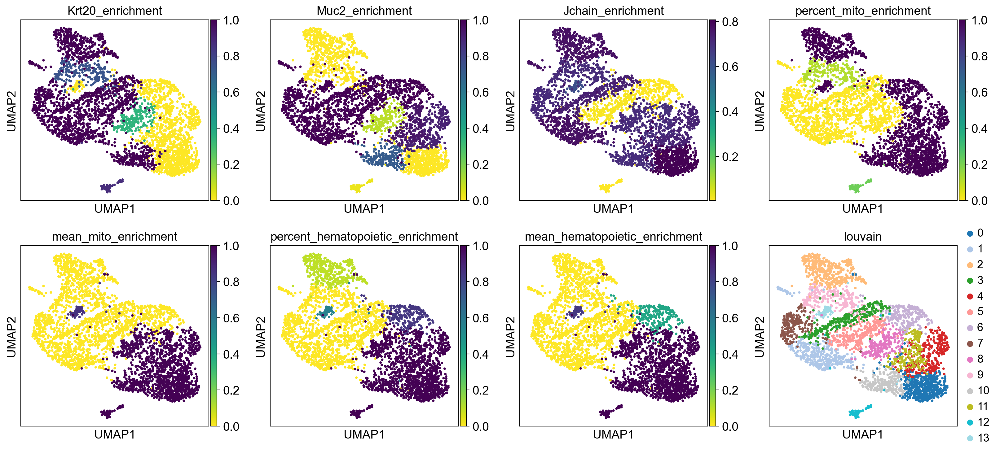

In [29]:
sc.pl.umap(adata,color=['Krt20_enrichment','Muc2_enrichment','Jchain_enrichment',
                        'percent_mito_enrichment','mean_mito_enrichment','percent_hematopoietic_enrichment','mean_hematopoietic_enrichment','louvain'],color_map='viridis_r')
#these are simply the p-values resulting from the features/featuresets tested, this visualization just shows a continuum of p-values per cluster given that test

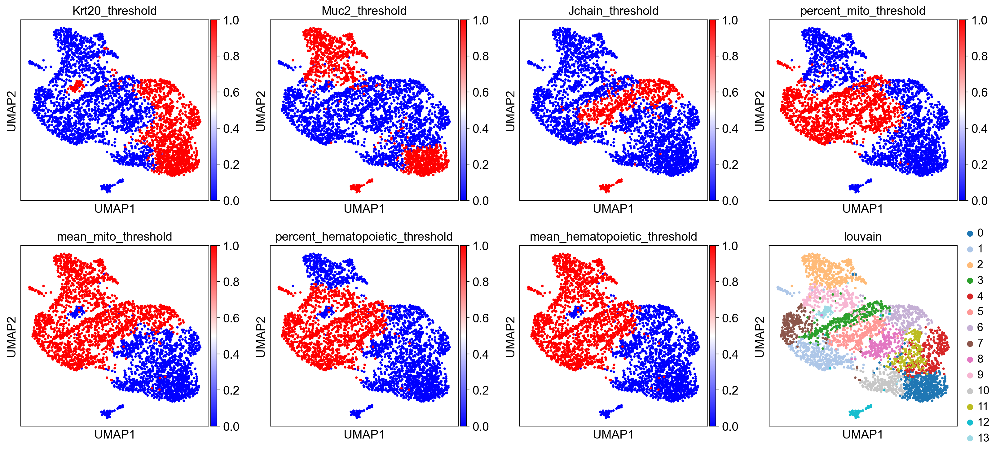

In [30]:
sc.pl.umap(adata,color=['Krt20_threshold','Muc2_threshold','Jchain_threshold',
                        'percent_mito_threshold','mean_mito_threshold','percent_hematopoietic_threshold','mean_hematopoietic_threshold','louvain'],color_map = 'bwr')
#similar to above, but with significance threholded at 0.05 as per the example, this gives us a better idea of which louvain clusters to gate out based off of statistical bases

In [31]:
#the above overlays are simply to guide the louvain cluster gating process by providing more quantitative and statistically robust methods for determining which clusters to gate out  

In [32]:
to_keep = adata.obs_names[np.where(adata.obs['louvain'].isin(['1','2','3','5','6','7','9','12','13']))[0]] #fill in the indices of the clusters you want to keep here
#we choose these to keep because all other clusters have a significant enrichment for mitochondrial genes or hematopoetic cells

In [33]:
to_keep

Index(['AGGGAACGAAAATCGTT', 'ACAACGTGGTTTACCCT', 'TGACTCAGAATGCCTCTTT',
       'GAAGTGATGCCAGTCCCT', 'AGGGAACGAGATCGTTT', 'GCAGTCGACCGCTGTT',
       'GATGACGGACCCGCAACT', 'AAATGACCCACTGAGTT', 'CAGTTTGCAGCACCAC',
       'CAGTTTGCACTCACCG',
       ...
       'AAAACCTCCCATCGCAG', 'TGACGTATCGGAAAGTCGG', 'ACCCTTGGTAGAGGTGG',
       'GATGCCATCGTTGATTCT', 'GAGTCATATTCGTACCTA', 'AACCTGACTAGAAATG',
       'GACTTACTCCGGTTTCTC', 'GCTTTGGCTCCCAATC', 'GATCGGTACGTAGTGTTT',
       'TTATAGCCGGGAAGGT'],
      dtype='object', length=2182)

In [34]:
adata_filtered = sc.read_h5ad("4058_colon.h5ad")

In [35]:
adata_filtered.obs["manual_label"] = "False"
adata_filtered.obs.loc[to_keep, "manual_label"] = "True"

In [36]:
adata_filtered.obs.manual_label.value_counts()

False    26952
True      2182
Name: manual_label, dtype: int64

In [37]:
adata_filtered.write_h5ad("4058_colon.h5ad",compression="gzip") #optional saving results to file as compressed .h5ad 

/Users/cody/.virtualenvs/sc/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'manual_label' as categorical
